<h1><center> Patient Survival Prediction using Deep Learning </center></h1>

### Contents

- Introduction
- Exploratory Data Analysis
- Data Preprocessing
- Baseline Neural Network
- Hyperparameter Tuning
- Explainable AI
- Acknowledgements
- References

### Importing libraries

In [ ]:
# File system manangement
import time, psutil, os

# Mathematical functions
import math

# Data manipulation
import numpy as np
import pandas as pd

# Plotting and visualization
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
sns.set_theme()
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Train-test split and k-fold cross validation
from sklearn.model_selection import train_test_split, KFold,  GridSearchCV

# Missing data imputation
from sklearn.impute import SimpleImputer

# Categorical data encoding
from sklearn.preprocessing import LabelEncoder

# Deep learning
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam

# Hyperparameter Tuning
!pip install -q -U keras-tuner
import keras_tuner as kt
from keras_tuner import HyperModel, Hyperband

# Model evaluation
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

# Model loading
from keras.models import load_model

# Explainable AI
!pip install shap
import shap

# Warning suppression
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Recording the starting time, which will be complemented with a time check at the end, to compute the total runtime of the process
start = time.time()

<a name = "Introduction"></a>
# 1. Introduction

## Data

Source: https://journals.lww.com/ccmjournal/Citation/2019/01001/33__THE_GLOBAL_OPEN_SOURCE_SEVERITY_OF_ILLNESS.36.aspx

In [ ]:
# Loading the data
data = pd.read_csv('https://raw.githubusercontent.com/sugatagh/Patient-Survival-Prediction-using-Deep-Learning/main/Dataset/Dataset.csv')

# Memory usage
print("Memory usage: {0:.2f} MB".format(data.memory_usage().sum()/(1024*1024)))

# Printing the dataframe
data

Memory usage: 130.15 MB


,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.730000,0,Caucasian,M,180.3,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.420000,0,Caucasian,F,160.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.950000,0,Caucasian,F,172.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.640000,1,Caucasian,F,165.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,91592,78108,30,0,75.0,23.060250,0,Caucasian,M,177.8,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular
91709,66119,13486,121,0,56.0,47.179671,0,Caucasian,F,183.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
91710,8981,58179,195,0,48.0,27.236914,0,Caucasian,M,170.2,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
91711,33776,120598,66,0,NaN,23.297481,0,Caucasian,F,154.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory


## Project Objective

The medical records of a patient play a significant role in determining his/her survival odds to a substantial extent. In this project, the objective is to predict whether a patient will survive or not, based on various relevant medical information.

<a name = "Exploratory-Data-Analysis"></a>
# 2. Exploratory Data Analysis

- Understanding Features
- Basic Data Exploration
- Univariate Analysis
- Multivariate Analysis

<a name = "Understanding-Features"></a>
## 2.1. Understanding Features

In [ ]:
# Loading data description
data_dictionary = pd.read_csv('https://raw.githubusercontent.com/sugatagh/Patient-Survival-Prediction-using-Deep-Learning/main/Dataset/Data%20Dictionary.csv')

# Memory usage
print("Memory usage: {0:.2f} MB".format(data_dictionary.memory_usage().sum()/(1024*1024)))

# Printing the dataframe
data_dictionary

Memory usage: 0.01 MB


,Category,Variable Name,Unit of Measure,Data Type,Description,Example
0,identifier,encounter_id,None,integer,Unique identifier associated with a patient un...,None
1,identifier,hospital_id,None,integer,Unique identifier associated with a hospital,None
2,identifier,patient_id,None,integer,Unique identifier associated with a patient,None
3,demographic,hospital_death,None,binary,Whether the patient died during this hospitali...,0
4,demographic,age,Years,numeric,The age of the patient on unit admission,None
...,...,...,...,...,...,...
183,APACHE comorbidity,lymphoma,None,binary,Whether the patient has been diagnosed with no...,1
184,APACHE comorbidity,solid_tumor_with_metastasis,None,binary,Whether the patient has been diagnosed with an...,1
185,APACHE grouping,apache_3j_bodysystem,None,string,Admission diagnosis group for APACHE III,Cardiovascular
186,APACHE grouping,apache_2_bodysystem,None,string,Admission diagnosis group for APACHE II,Respiratory


<a name = "Basic-Data-Exploration"></a>
## 2.2. Basic Data Exploration

In [ ]:
# Shape of the data
print(pd.Series({"Shape of the dataset": data.shape}).to_string())

Shape of the dataset    (91713, 186)


In [ ]:
# Count of observations
print(pd.Series({"Number of observations in the dataset": len(data)}).to_string())

Number of observations in the dataset    91713


In [ ]:
# Count of columns
print(pd.Series({"Total number of columns in the dataset": len(data.columns)}).to_string())

Total number of columns in the dataset    186


In [ ]:
# Column names
data.columns

Index(['encounter_id', 'patient_id', 'hospital_id', 'hospital_death', 'age',
       'bmi', 'elective_surgery', 'ethnicity', 'gender', 'height',
       ...
       'aids', 'cirrhosis', 'diabetes_mellitus', 'hepatic_failure',
       'immunosuppression', 'leukemia', 'lymphoma',
       'solid_tumor_with_metastasis', 'apache_3j_bodysystem',
       'apache_2_bodysystem'],
      dtype='object', length=186)

In [ ]:
# Column datatypes
print(data.dtypes)

encounter_id                     int64
patient_id                       int64
hospital_id                      int64
hospital_death                   int64
age                            float64
                                ...   
leukemia                       float64
lymphoma                       float64
solid_tumor_with_metastasis    float64
apache_3j_bodysystem            object
apache_2_bodysystem             object
Length: 186, dtype: object


In [ ]:
# Count of column datatypes
cols_int = data.columns[data.dtypes == 'int64'].tolist()
cols_float = data.columns[data.dtypes == 'float64'].tolist()
cols_object = data.columns[data.dtypes == 'object'].tolist()
print(pd.Series({"Number of integer columns": len(cols_int),
                 "Number of float columns": len(cols_float),
                 "Number of object columns": len(cols_object)}).to_string())

Number of integer columns      8
Number of float columns      170
Number of object columns       8


In [ ]:
# Count of duplicate rows
print(pd.Series({"Number of duplicate rows in the dataset": data.duplicated().sum()}).to_string())

Number of duplicate rows in the dataset    0


In [ ]:
# Count of duplicate columns
print(pd.Series({"Number of duplicate columns in the dataset": data.T.duplicated().sum()}).to_string())

Number of duplicate columns in the dataset    3


In [ ]:
# Constant columns
cols_constant = data.columns[data.nunique() == 1].tolist()
if len(cols_constant) == 0:
    cols_constant = "None"
print(pd.Series({"Constant columns in the dataset": cols_constant}).to_string())

Constant columns in the dataset    [readmission_status]


In [ ]:
# Count of columns with missing values
print(pd.Series({"Number of columns with missing values in the dataset": len(data.isna().sum()[data.isna().sum() != 0])}).to_string())

Number of columns with missing values in the dataset    175


In [ ]:
# Columns with missing values and respective proportions of values that are missing
print((data.isna().sum()/len(data))[data.isna().sum() != 0].sort_values(ascending = False))

h1_bilirubin_max    0.922650
h1_bilirubin_min    0.922650
h1_lactate_min      0.919924
h1_lactate_max      0.919924
h1_albumin_max      0.913982
                      ...   
d1_sysbp_max        0.001734
d1_heartrate_max    0.001581
d1_heartrate_min    0.001581
icu_admit_source    0.001221
gender              0.000273
Length: 175, dtype: float64


In [ ]:
# Statistical description of numerical variables in the dataset
data.describe()

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,...,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
count,91713.000000,91713.000000,91713.000000,91713.000000,87485.000000,88284.000000,91713.000000,90379.000000,91713.000000,91713.000000,...,83766.000000,83766.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000
mean,65606.079280,65537.131464,105.669262,0.086302,62.309516,29.185818,0.183736,169.641588,508.357692,0.835766,...,0.086787,0.043955,0.000857,0.015693,0.225192,0.012989,0.026165,0.007066,0.004132,0.020638
std,37795.088538,37811.252183,62.854406,0.280811,16.775119,8.275142,0.387271,10.795378,228.989661,2.487756,...,0.247569,0.217341,0.029265,0.124284,0.417711,0.113229,0.159628,0.083763,0.064148,0.142169
min,1.000000,1.000000,2.000000,0.000000,16.000000,14.844926,0.000000,137.200000,82.000000,-24.947222,...,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32852.000000,32830.000000,47.000000,0.000000,52.000000,23.641975,0.000000,162.500000,369.000000,0.035417,...,0.020000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,65665.000000,65413.000000,109.000000,0.000000,65.000000,27.654655,0.000000,170.100000,504.000000,0.138889,...,0.050000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,98342.000000,98298.000000,161.000000,0.000000,75.000000,32.930206,0.000000,177.800000,679.000000,0.409028,...,0.130000,0.060000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,131051.000000,131051.000000,204.000000,1.000000,89.000000,67.814990,1.000000,195.590000,927.000000,159.090972,...,0.990000,0.970000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
# Statistical description of categorical variables in the dataset
data.describe(include = ['O'])

,ethnicity,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,apache_3j_bodysystem,apache_2_bodysystem
count,90318,91688,70304,91601,91713,91713,90051,90051
unique,6,2,15,5,3,8,11,10
top,Caucasian,M,Emergency Department,Accident & Emergency,admit,Med-Surg ICU,Cardiovascular,Cardiovascular
freq,70684,49469,36962,54060,86183,50586,29999,38816


In [ ]:
# Dropping constant columns
data.drop(cols_constant, axis = 1, inplace = True)
cols_int.remove('readmission_status')

**Dataset synopsis:**

- Number of observations: $91713$
- Number of columns: $186$
- Number of integer columns: $8$
- Number of float columns: $170$
- Number of object columns: $8$
- Number of duplicate observations: $0$
- Constant column: `readmission_status`
- Number of columns with missing values: $175$
- Columns with over $90\%$ missing values: `h1_bilirubin_max`, `h1_bilirubin_min`, `h1_lactate_min`, `h1_lactate_max`, `h1_albumin_max`
- Memory Usage: $130.15$ MB

<a name = "Univariate-Analysis"></a>
## 2.3. Univariate Analysis

- Target variable
- Predictor variables

In general, throughout the notebook, we choose the number of bins of a histogram by the [Freedman-Diaconis rule](https://en.wikipedia.org/wiki/Freedman%E2%80%93Diaconis_rule), which suggests the optimal number of bins to grow as $k \sim n^{1/3},$ where $n$ is the total number of observations.

In [ ]:
# Setting the number of bins
bins_fd = math.floor(len(data)**(1/3))

<a name = "Target-variable"></a>
### 2.3.1. Target variable

The target variable `hospital_death` is a binary variable indicating the survival status of a patient.
\begin{align*}
&0 \mapsto \text{patient survived}\\
&1 \mapsto \text{patient died}
\end{align*}

In [ ]:
# Function to construct barplot and donutplot of a dataframe column
def bar_donut(df, col, height = 500, width = 800, manual_title_text = False, title_text = "Frequency distribution"):
    fig = make_subplots(rows = 1, cols = 2, specs = [[{'type': 'xy'}, {'type': 'domain'}]])
    fig.add_trace(go.Bar(x = df[col].value_counts(sort = False).index.tolist(),
                         y = df[col].value_counts(sort = False).tolist(),
                         text = df[col].value_counts(sort = False).tolist(),
                         textposition = 'auto'),
                         row = 1, col = 1)
    fig.add_trace(go.Pie(values = df[col].value_counts(sort = False).tolist(),
                         labels = df[col].value_counts(sort = False).index.tolist(),
                         hole = 0.5, textinfo = 'label+percent', title = f"{col}"),
                         row = 1, col = 2)
    fig.update_layout(height = height, width = width, showlegend = False,
                      title = {'text': f"Frequency distribution of {col}",
                               'y': 0.95, 'x': 0.5, 'xanchor': 'center', 'yanchor': 'top'},
                      xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1))
    if manual_title_text == True:
        fig.update_layout(height = height, width = width, showlegend = False,
                          title = {'text': title_text,
                                   'y': 0.95, 'x': 0.5, 'xanchor': 'center', 'yanchor': 'top'},
                          xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1))
    fig.show()

In [ ]:
# hospital_death
bar_donut(data, 'hospital_death')

**Observation:** The dataset is imbalanced with respect to the target variable

<a name = "Predictor-variables"></a>
### 2.3.2 Predictor variables

In [ ]:
# Function to compute almost constant columns and relative frequencies of corresponding modes
def almost_constant(df, threshold = 0.9, show = True, return_list = True):
    rel_freq = []
    for col in df.columns:
        mode_rel_freq = max(df[col].value_counts(sort = True)/len(df[col]))
        if mode_rel_freq > threshold:
            rel_freq.append((col, mode_rel_freq))
    keys = [item[0] for item in rel_freq]
    values = [item[1] for item in rel_freq]
    series = pd.Series(data = values, index = keys).sort_values(ascending = False)
    if show == True:
        print(series.to_string())
    if return_list == True:
        return keys

In [ ]:
# Almost constant columns and relative frequencies of corresponding modes
almost_constant_cols = almost_constant(data.drop('hospital_death', axis = 1), threshold = 0.9)

aids                           0.991353
lymphoma                       0.988104
leukemia                       0.985193
hepatic_failure                0.979316
gcs_unable_apache              0.979272
cirrhosis                      0.976634
solid_tumor_with_metastasis    0.971727
immunosuppression              0.966243
arf_apache                     0.964443
icu_stay_type                  0.939703


**Observations:**
- The column `readmission_status` is same for every observation, and hence is not relevant in the context of predicting the target variable
- Apart from `readmission_status`, relative frequency of the mode value is over $0.9$ for $10$ other predictor variables, among which `icu_stay_type` is an object variable, taking values `admit`, `transfer` and `readmit`, while the rest are binary float variables, taking values `0.0` and `1.0`

In [ ]:
# Donutplots in N x 3 grid form
def donuts_grid(df, cols, ncols = 3, hole = 0.5, height = 1500, width = 900):
    nrows = math.ceil(len(cols)/ncols)
    specs = np.full((nrows, ncols), {'type': 'domain'}).tolist()
    fig = make_subplots(rows = nrows, cols = ncols, specs = specs)
    count = 0
    break_flag = False
    for row in range(nrows):
        for col in range(ncols):
            i = (row * ncols) + col
            fig.add_trace(go.Pie(values = df[cols[i]].value_counts(sort = False).tolist(),
                                 labels = df[cols[i]].value_counts(sort = False).index.tolist(),
                                 hole = hole, textinfo = 'percent', title = f'{cols[i]}'),    # 'label+percent'
                          row = row + 1, col = col + 1)
            count = count + 1
            if count == len(cols):
                break_flag = True
                break

        if break_flag == True:
            break

    fig.update_layout(height = height, width = width)
    fig.show()

In [ ]:
# Binary columns except gender and hospital_death
cols_binary = [col for col in data.columns if data[col].nunique() == 2]
cols_binary.remove('gender')
cols_binary.remove('hospital_death')
donuts_grid(data, cols_binary, ncols = 4, hole = 0.5, height = 1250, width = 1200)

In [ ]:
# gender and icu_stay_type
fig = make_subplots(rows = 1, cols = 2, specs = [[{'type': 'domain'}, {'type': 'domain'}]])
fig.add_trace(go.Pie(values = data['gender'].value_counts(sort = False).tolist(),
                     labels = data['gender'].value_counts(sort = False).index.tolist(),
                     hole = 0.5, textinfo = 'label+percent', title = 'gender'),
                     row = 1, col = 1)
fig.add_trace(go.Pie(values = data['icu_stay_type'].value_counts(sort = False).tolist(),
                     labels = data['icu_stay_type'].value_counts(sort = False).index.tolist(),
                     hole = 0.5, textinfo = 'label+percent', title = 'icu_stay_type'),
                     row = 1, col = 2)
fig.update_layout(height = 450, width = 900, showlegend = False)
fig.show()

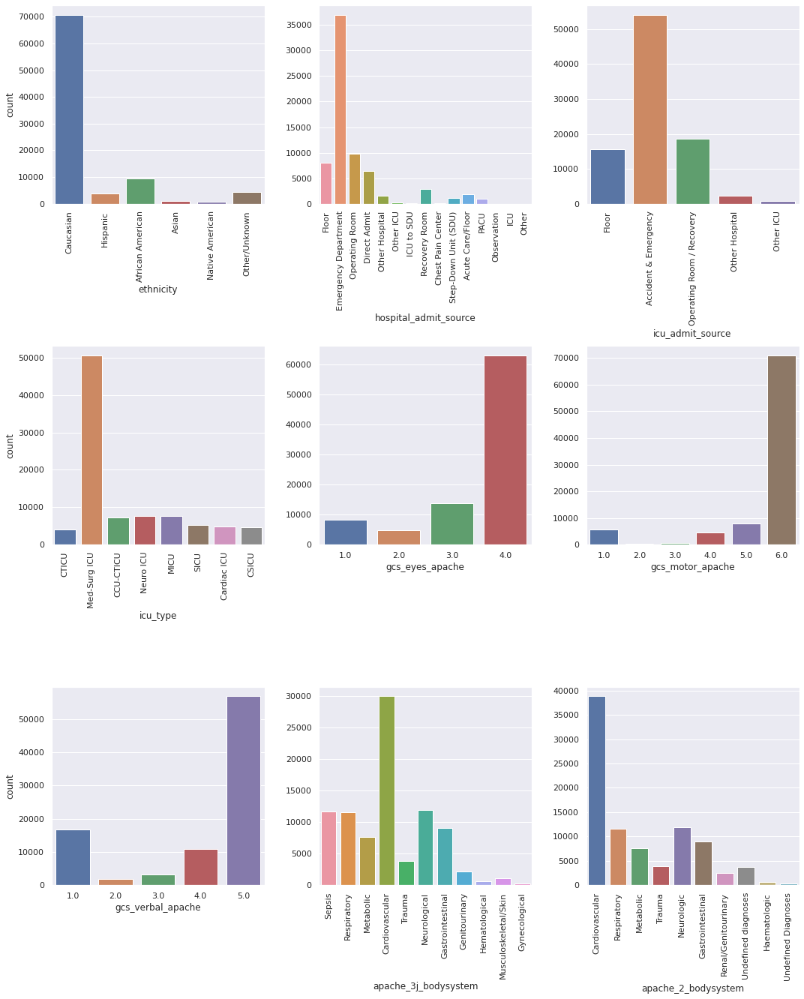

In [ ]:
# Columns with 4 to 15 distinct values
cols_selected = [col for col in data.columns if 3 < data[col].nunique() <= 15]
col_vert = ['ethnicity', 'hospital_admit_source', 'icu_admit_source', 'icu_type', 'apache_3j_bodysystem', 'apache_2_bodysystem']
nrows = math.ceil(len(cols_selected)/3)
fig, ax = plt.subplots(nrows, 3, figsize = (15, 6.2 * nrows), sharey = False)
for i in range(len(cols_selected)):
    countplot = sns.countplot(data = data, x = cols_selected[i], ax = ax[i//3, i%3])
    if cols_selected[i] in col_vert:
        countplot.set_xticklabels(countplot.get_xticklabels(), rotation = 90)
    if i%3 != 0:
        ax[i//3, i%3].set_ylabel(" ")
plt.tight_layout()
plt.show()

In [ ]:
# Non-float columns with more than 15 distinct values
[col for col in data.columns if data[col].nunique() > 15 and data[col].dtype != 'float64']

['encounter_id', 'patient_id', 'hospital_id', 'icu_id']

In [ ]:
# Number of unique values
keys = ['encounter_id', 'patient_id', 'hospital_id', 'icu_id']
values = [data[col].nunique() for col in keys]
print(pd.Series(data = values, index = keys).to_string())

encounter_id    91713
patient_id      91713
hospital_id       147
icu_id            241


**Observation:** The features `encounter_id` and `patient_id` are unique for each observation, and hence do not contribute to the task of predicting the target variable.

In [ ]:
# Dropping encounter_id and patient_id
data.drop(['encounter_id', 'patient_id'], axis = 1, inplace = True)
cols_int.remove('encounter_id')
cols_int.remove('patient_id')

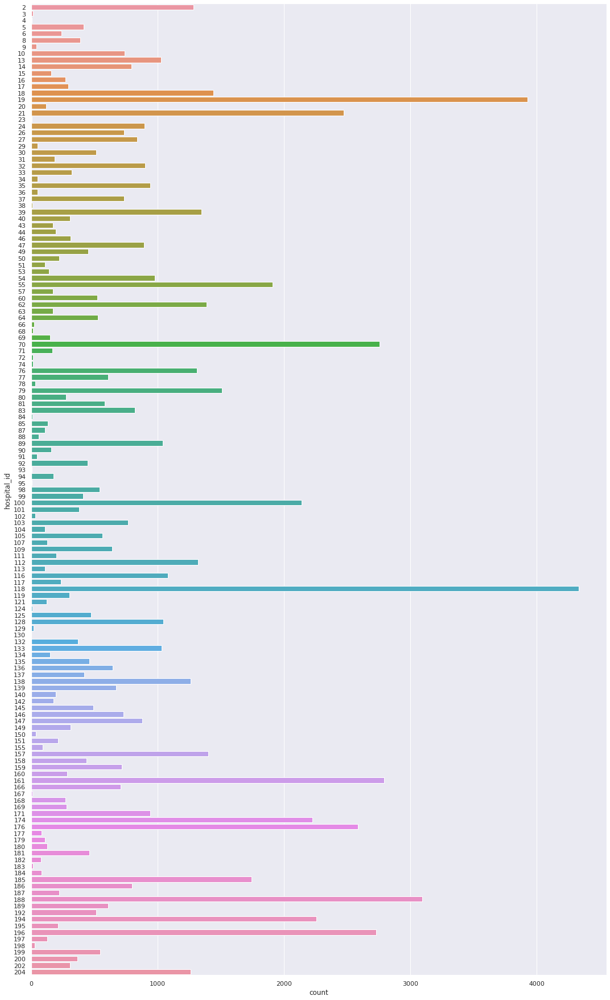

In [ ]:
# hospital_id
plt.figure(figsize = (15, data['hospital_id'].nunique()/6))
sns.countplot(data = data, y = 'hospital_id')
plt.tight_layout()
plt.show()

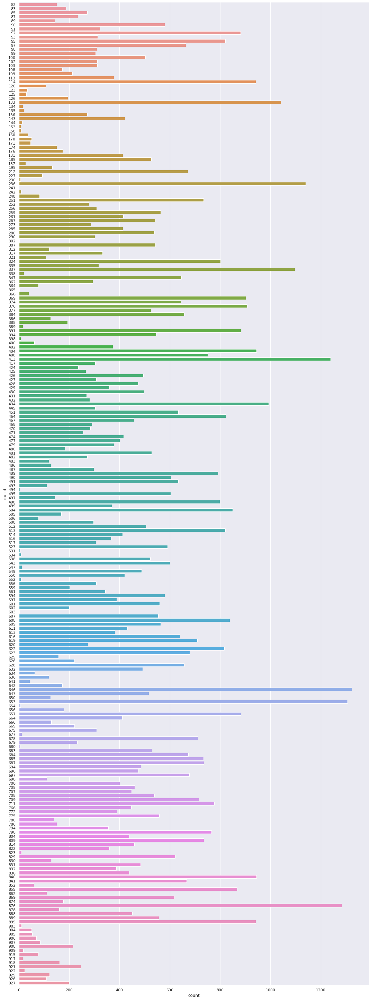

In [ ]:
# icu_id
plt.figure(figsize = (15, data['icu_id'].nunique()/6))
sns.countplot(data = data, y = 'icu_id')
plt.tight_layout()
plt.show()

In [ ]:
# Histograms in grid
def distribution_plot(df, cols, ncols = 4, kind = 'hist', hue = None, height = 0.84*4, width = 4):
    cols = [col for col in df.columns if df[col].nunique() > 15 and df[col].dtype == 'float64']
    bins_fd = math.floor(len(df)**(1/3))
    nrows = math.ceil(len(cols)/ncols)
    if kind == 'hist':
        fig, ax = plt.subplots(nrows, ncols, figsize = (width*ncols, height*nrows), sharey = False)
        for i in range(len(cols)):
            sns.histplot(data = df, x = cols[i], bins = bins_fd, hue = hue, ax = ax[i // ncols, i % ncols])
            if i % ncols != 0:
                ax[i // ncols, i % ncols].set_ylabel(" ")
    elif kind == 'kde':
        fig, ax = plt.subplots(nrows, ncols, figsize = (width*ncols, height*nrows), sharey = False)
        for i in range(len(cols)):
            sns.kdeplot(data = df, x = cols[i], hue = hue, ax = ax[i // ncols, i % ncols])
            if i % ncols != 0:
                ax[i // ncols, i % ncols].set_ylabel(" ")
    else:
        raise TypeError(f"'{kind}' is not a valid argument for the parameter kind. Use 'hist' or 'kde'.")
    plt.tight_layout()
    plt.show()

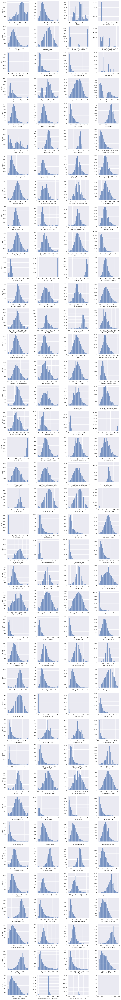

In [ ]:
# Float columns with more than 15 distinct values
cols_selected = [col for col in data.columns if data[col].nunique() > 15 and data[col].dtype == 'float64']
distribution_plot(df = data, cols = cols_selected, kind = 'hist')

<a name = "Multivariate-Analysis"></a>
## 2.4. Multivariate Analysis

- Relationships among the predictor variables
- Relationships of the target variable with the predictor variables

<a name = "Relationships-among-the-predictor-variables"></a>
### 2.4.1. Relationships among the predictor variables

### Correlation structure among numerical features

In [ ]:
# Heatmap
cols_selected = [col for col in cols_int + cols_float if col != 'hospital_death']
plt.figure(figsize = (180, 135))
sns.heatmap(data[cols_selected].corr(), annot = True, cmap = plt.cm.CMRmap_r)

In [ ]:
# Function to detect pairs with extreme correlation
def pairs_with_strong_corr(df, cols, threshold = 0.8, show = True, return_variables = False):
    variable_list = []
    corr_positive_list = []
    corr_negative_list = []
    for i in range(len(cols)):
        for j in range(len(cols)):
            if i<j:
                corr = df[cols[i]].corr(df[cols[j]])
                if corr > threshold:
                    variable_list = variable_list + [cols[i], cols[j]]
                    corr_positive_list.append(((cols[i], cols[j]), corr))
                if corr < -threshold:
                    variable_list = variable_list + [cols[i], cols[j]]
                    corr_negative_list.append(((cols[i], cols[j]), corr))
    if show == True:
        corr_positive = pd.Series(data = [item[1] for item in corr_positive_list], index = [item[0] for item in corr_positive_list])
        corr_negative = pd.Series(data = [item[1] for item in corr_negative_list], index = [item[0] for item in corr_negative_list])
        print("Pairs with extreme positive correlation:")
        print(" ")
        print(corr_positive.sort_values(ascending = False).to_string())
        print(" ")
        print("Pairs with extreme negative correlation:")
        print(" ")
        print(corr_negative.sort_values(ascending = True).to_string())
    if return_variables == True:
        return variable_list

In [ ]:
# Detecting pairs with extreme correlation
cols_selected = [col for col in cols_int + cols_float if col != 'hospital_death']
pairs_with_strong_corr(df = data, cols = cols_selected, threshold = 0.9)

Pairs with extreme positive correlation:
 
(d1_inr_min, h1_inr_min)                        1.000000
(paco2_apache, paco2_for_ph_apache)             1.000000
(d1_inr_max, h1_inr_max)                        1.000000
(h1_bilirubin_max, h1_bilirubin_min)            0.999934
(h1_albumin_max, h1_albumin_min)                0.999727
(h1_bun_max, h1_bun_min)                        0.999630
(h1_creatinine_max, h1_creatinine_min)          0.999405
(h1_platelets_max, h1_platelets_min)            0.998206
(d1_diasbp_max, d1_diasbp_noninvasive_max)      0.997831
(h1_wbc_max, h1_wbc_min)                        0.997524
(d1_diasbp_min, d1_diasbp_noninvasive_min)      0.996871
(h1_mbp_min, h1_mbp_noninvasive_min)            0.996673
(bilirubin_apache, d1_bilirubin_max)            0.996568
(d1_sysbp_max, d1_sysbp_noninvasive_max)        0.996560
(h1_sysbp_max, h1_sysbp_noninvasive_max)        0.996377
(d1_sysbp_min, d1_sysbp_noninvasive_min)        0.996322
(d1_mbp_min, d1_mbp_noninvasive_min)         

**Observations:**

- There are $94$ pairs of numerical features with correlation coefficient over $0.9$
- There are no pair of numerical features with correlation coefficient below $-0.9$
- $3$ pairs of numerical features have correlation coefficient exactly equal to $1,$ i.e. there exists perfect linear relationship (with positive slope) between the variables in each of those pairs (this corresponds to the fact that there are $3$ duplicate columns in the dataset)

<a name = "Relationships-of-the-target-variable-with-the-predictor-variables"></a>
### 2.4.2. Relationships of the target variable with the predictor variables

In [ ]:
# Contingency tables for target variable and binary features
def contingency_binary(df, target, ncols = 3, figsize_multiplier = 2):
    cols_binary = [col for col in df.columns if df[col].nunique() == 2]
    cols_binary.remove(target)
    if len(cols_binary) == 0:
        print("The dataset does not contain a binary feature")
    else:
        nrows = math.ceil(len(cols_binary)/ncols)
        nvals = 2 # Binary variables
        figsize = (figsize_multiplier*nvals*ncols, 0.8*figsize_multiplier*nvals*nrows)
        fig, ax = plt.subplots(nrows, ncols, figsize = figsize, sharey = False)
        class_names_2 = df[target].value_counts().index.tolist()
        for i in range(len(cols_binary)):
            class_names_1 = df[cols_binary[i]].value_counts().index.tolist()
            contingency_mat = np.zeros(shape = (len(class_names_2), len(class_names_1)))
            for j in range(len(class_names_2)):
                for k in range(len(class_names_1)):
                    contingency_mat[j][k] = len([l for l in range(len(df)) if df[target][l] == class_names_2[j] and df[cols_binary[i]][l] == class_names_1[k]])
            contingency_table_df = pd.DataFrame(contingency_mat)
            hm = sns.heatmap(contingency_table_df, annot = True, annot_kws = {"size": 16}, fmt = 'g', ax = ax[i // ncols, i % ncols])
            hm.set_xlabel(f'{cols_binary[i]}', fontsize = 14)
            hm.set_ylabel(target, fontsize = 14)
            hm.set_xticklabels(class_names_1, fontdict = {'fontsize': 12}, rotation = 0, ha = "right")
            hm.set_yticklabels(class_names_2, fontdict = {'fontsize': 12}, rotation = 0, ha = "right")
            if i % ncols != 0:
                ax[i // ncols, i % ncols].set_ylabel(" ")
        plt.tight_layout()
        plt.show()

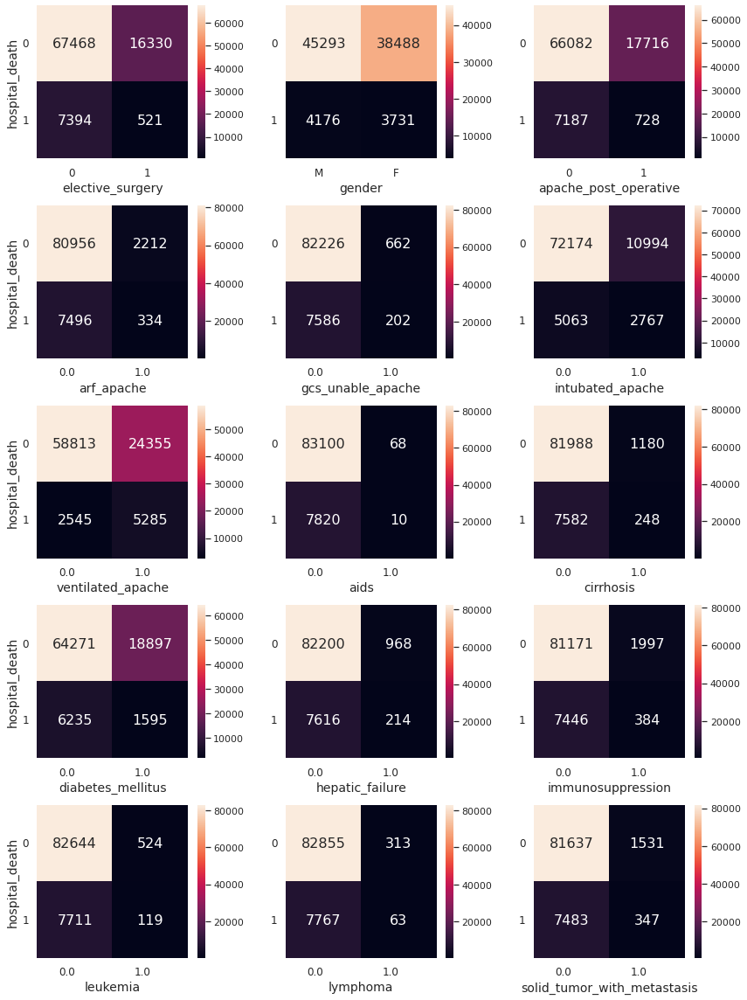

In [ ]:
# Target x Binary features
contingency_binary(df = data, target = 'hospital_death', ncols = 3, figsize_multiplier = 2)

In [ ]:
# Contingency table for target variable and general categorical feature
def contingency_table(df, feature, target, figsize_multiplier = 2, title = False, rotate_xticklabels = 0, rotate_yticklabels = 0):
    class_names_1 = df[feature].value_counts().index.tolist()
    class_names_2 = df[target].value_counts().index.tolist()

    contingency_mat = np.zeros(shape = (len(class_names_2), len(class_names_1)))
    for i in range(len(class_names_2)):
        for j in range(len(class_names_1)):
            contingency_mat[i][j] = len([k for k in range(len(df)) if df[target][k] == class_names_2[i] and df[feature][k] == class_names_1[j]])

    contingency_table_df = pd.DataFrame(contingency_mat)
    plt.figure(figsize = (figsize_multiplier*len(class_names_1), 0.8*figsize_multiplier*len(class_names_2)))
    if title == True:
        plt.title(f"{target} x {feature}")
    hm = sns.heatmap(contingency_table_df, annot = True, annot_kws = {"size": 16}, fmt = 'g')
    hm.set_xlabel(f'{feature}', fontsize = 14)
    hm.set_ylabel(f'{target}', fontsize = 14)
    hm.set_xticklabels(class_names_1, fontdict = {'fontsize': 12}, rotation = rotate_xticklabels, ha = "right")
    hm.set_yticklabels(class_names_2, fontdict = {'fontsize': 12}, rotation = rotate_yticklabels, ha = "right")
    plt.grid(False)
    plt.show()

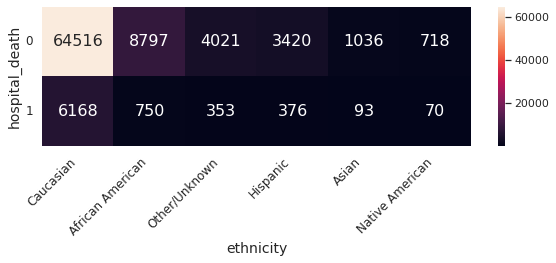

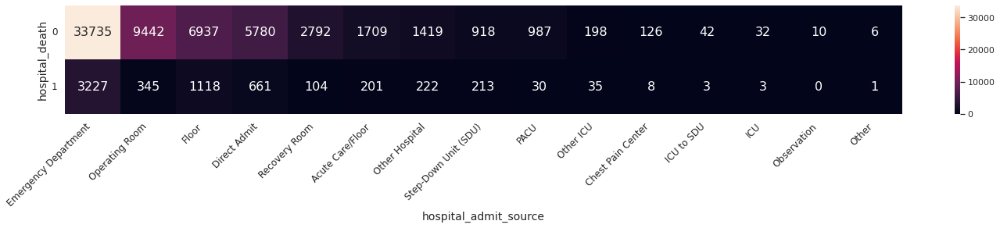

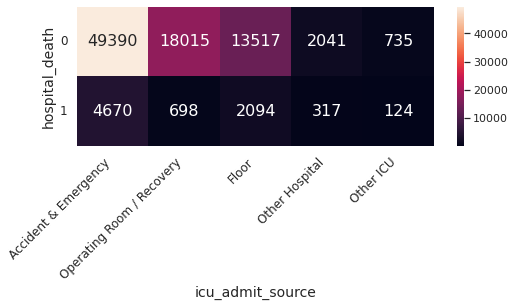

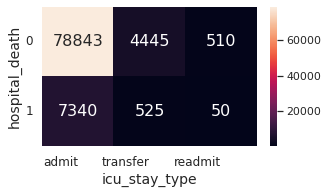

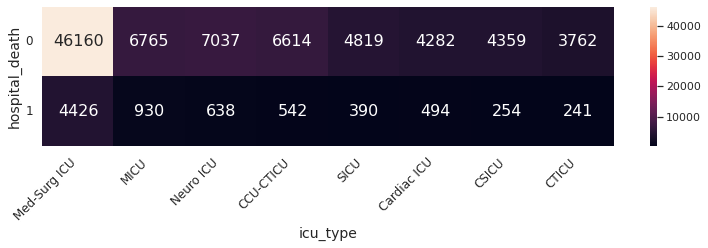

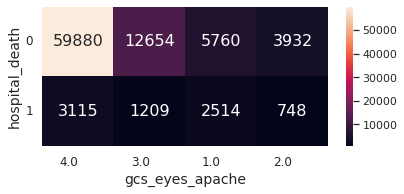

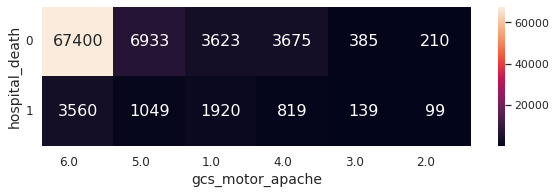

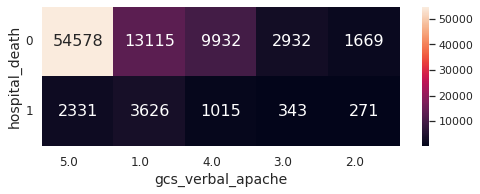

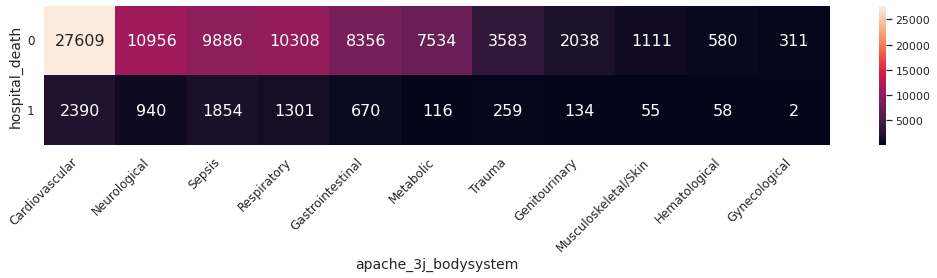

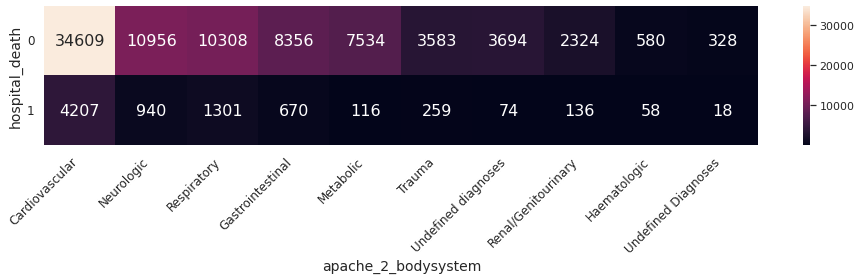

In [ ]:
# Target x Features taking 3 to 15 distinct values
cols_selected = [col for col in data.columns if 3 <= data[col].nunique() <= 15]
cols_xticklabels = ['ethnicity', 'hospital_admit_source', 'icu_admit_source', 'icu_type', 'apache_3j_bodysystem', 'apache_2_bodysystem']
for col in cols_selected:
    if col in cols_xticklabels:
        rotate_xticklabels = 45
    else:
        rotate_xticklabels = 0
    contingency_table(df = data, feature = col, target = 'hospital_death', figsize_multiplier = 1.6, rotate_xticklabels = rotate_xticklabels)

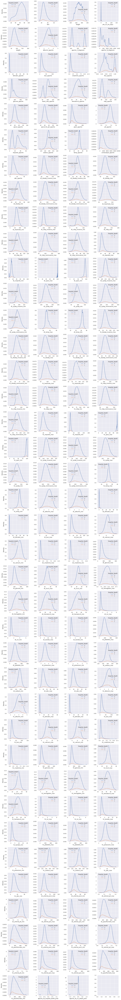

In [ ]:
# Target x Float features with more than 15 distinct values
cols_selected = [col for col in data.columns if data[col].nunique() > 15 and data[col].dtype == 'float64']
distribution_plot(df = data, cols = cols_selected, kind = 'kde', hue = 'hospital_death')

<a name = "Data-Preprocessing"></a>
# 3. Data Preprocessing

- Train-Test Split
- Missing Data Imputation
- Categorical Data Encoding
- Normalization

<a name = "Train-Test-Split"></a>
## 3.1. Train-Test Split

In [ ]:
X = data.drop('hospital_death', axis = 1) # Independent variables
y = data['hospital_death'] # Target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True)

### Training data

In [ ]:
# Training set - Predictor variables
X_train

,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
44644,100,59.0,32.205620,0,Asian,M,152.40,Direct Admit,Operating Room / Recovery,490,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
71898,13,63.0,29.337519,0,Caucasian,M,172.70,NaN,Accident & Emergency,694,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
51963,133,57.0,33.973216,0,Caucasian,M,175.30,Operating Room,Operating Room / Recovery,549,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Undefined diagnoses
9221,137,76.0,23.313312,0,Caucasian,M,177.80,Emergency Department,Accident & Emergency,143,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
6154,46,71.0,NaN,0,Caucasian,F,157.50,NaN,Accident & Emergency,98,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41398,186,79.0,19.067711,0,Caucasian,F,157.00,Operating Room,Operating Room / Recovery,498,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Gastrointestinal,Gastrointestinal
38127,62,64.0,29.505162,1,African American,M,172.70,Recovery Room,Operating Room / Recovery,467,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Undefined diagnoses
19926,112,36.0,36.219460,0,Caucasian,M,177.80,Emergency Department,Accident & Emergency,384,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
26561,161,34.0,26.424594,0,Caucasian,M,182.80,NaN,Accident & Emergency,413,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic


In [ ]:
# Training set - Target variable
bar_donut(pd.DataFrame(y_train), 'hospital_death',  manual_title_text = True,
          title_text = "Frequency distribution of hospital_death in the training set")

### Test data

In [ ]:
# Test set - Predictor variables
X_test

,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
89276,35,69.0,32.687639,0,Caucasian,M,165.1,Acute Care/Floor,Floor,895,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Gastrointestinal,Gastrointestinal
84930,188,68.0,24.841260,0,Other/Unknown,M,182.9,Acute Care/Floor,Floor,889,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
179,118,65.0,34.141074,0,Caucasian,F,170.2,Floor,Operating Room / Recovery,97,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Gastrointestinal,Gastrointestinal
81883,196,71.0,26.018188,0,Caucasian,M,172.7,NaN,Accident & Emergency,822,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
15617,98,75.0,20.881986,0,African American,F,152.4,Emergency Department,Accident & Emergency,267,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21105,161,18.0,23.408210,0,Caucasian,M,177.8,Emergency Department,Accident & Emergency,408,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Musculoskeletal/Skin,Undefined Diagnoses
58278,39,42.0,24.933452,1,Other/Unknown,F,161.0,Recovery Room,Operating Room / Recovery,619,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
57986,176,87.0,33.487049,0,Caucasian,M,180.3,Step-Down Unit (SDU),Floor,628,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
40814,62,61.0,23.543188,0,Caucasian,F,170.2,Emergency Department,Accident & Emergency,481,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic


In [ ]:
# Test set - Target variable
bar_donut(pd.DataFrame(y_test), 'hospital_death', manual_title_text = True,
          title_text = "Frequency distribution of hospital_death in the test set")

<a name = "Missing-Data-Imputation"></a>
## 3.2. Missing Data Imputation

In [ ]:
# Count of missing values for the target variable
print(pd.Series({"Number of missing target values in the training set": y_train.isna().sum(),
                 "Number of missing target values in the test set": y_test.isna().sum()}).to_string())

Number of missing target values in the training set    0
Number of missing target values in the test set        0


### Dropping columns with majority of the observations missing

In [ ]:
# Columns with more than 50% missing values in the training set
print((X_train.isna().sum()/len(X_train))[X_train.isna().sum()/len(X_train) > 0.5].sort_values(ascending = False))

h1_bilirubin_max      0.922720
h1_bilirubin_min      0.922720
h1_lactate_min        0.919463
h1_lactate_max        0.919463
h1_albumin_max        0.914011
                        ...   
h1_glucose_max        0.574785
h1_glucose_min        0.574785
d1_albumin_min        0.536268
d1_albumin_max        0.536268
urineoutput_apache    0.532752
Length: 74, dtype: float64


We drop the $74$ features, which have over $50\%$ values missing in the training dataset, from the subsequent analysis.

In [ ]:
# Dropping columns with more than 50% missing values in the training set
majority_missing = (X_train.isna().sum()/len(X_train))[data.isna().sum()/len(data) > 0.5].index.tolist()
X_train.drop(majority_missing, axis = 1, inplace = True)
X_test.drop(majority_missing, axis = 1, inplace = True)

### Mode imputation

In [ ]:
# Function to impute missing values with the most frequent value appearing in the corresponding columns
def mode_imputer(data):
    data_imputed = data.copy(deep = True)
    imputer = SimpleImputer(strategy = 'most_frequent')
    data_imputed.iloc[:, :] = imputer.fit_transform(data_imputed)
    return data_imputed

### Proportion-based imputation

With the goal of keeping the feature distributions same before and after imputation, we impute the missing values in a column in such a way so that the proportions of the existing unique values in that particular column remain roughly same as those were prior to the imputation. The following function takes a dataframe, implements the proportion-based imputation in each column containing missing values and returns the resulting dataframe.

In [ ]:
# Function to impute missing values proportionately with respect to the existing unique values
def prop_imputer(df):
    df_prop = df.copy(deep = True)
    missing_cols = df_prop.isna().sum()[df_prop.isna().sum() != 0].index.tolist()
    for col in missing_cols:
        values_col = df_prop[col].value_counts(normalize = True).index.tolist()
        probabilities_col = df_prop[col].value_counts(normalize = True).values.tolist()
        df_prop[col] = df_prop[col].fillna(pd.Series(data = np.random.choice(values_col, p = probabilities_col, size = len(df_prop)), index = df_prop[col].index))
    return df_prop

In [ ]:
# Proportion-based imputation
X_train = prop_imputer(X_train)
X_test = prop_imputer(X_test)

<a name = "Categorical-Data-Encoding"></a>
## 3.3. Categorical Data Encoding

In [ ]:
# Object type columns and corresponding number of unique values
print(pd.Series(data = [data[col].nunique() for col in cols_object], index = cols_object).to_string())

ethnicity                 6
gender                    2
hospital_admit_source    15
icu_admit_source          5
icu_stay_type             3
icu_type                  8
apache_3j_bodysystem     11
apache_2_bodysystem      10


All $8$ categorical features are nominal in nature, i.e. there is no notion of order in their realized values.

### Label encoding

In [ ]:
def label_encoder(df, cols):
    df_le = df.copy(deep = True)
    le = LabelEncoder()
    for col in cols:
        df_le[col] = le.fit_transform(df_le[col])
    return df_le

Explanation of the arguments:
- **df:** The input dataset
- **cols:** List of columns that we want to encode

In [ ]:
X_train_le = label_encoder(X_train, cols_object)
X_test_le = label_encoder(X_test, cols_object)

For a categorical column with $n$ distinct values, the label encoder maps the $n$ distinct values to numerical values between $0$ and $n-1$.

In [ ]:
# Example
X_train_le[[col for col in X_train_le.columns if cols_object[1] in col]]

,gender
44644,1
71898,1
51963,1
9221,1
6154,0
...,...
41398,0
38127,1
19926,1
26561,1


### One-hot encoding

In [ ]:
# Function for one-hot encoding
def one_hot_encoder(df, cols, drop_first = False):
    cols = [col for col in cols if col in df.columns] # To ensure that 'cols' is contained (as a subset) within df.columns
    df_ohe = pd.get_dummies(df, columns = cols, drop_first = drop_first)
    return df_ohe

Explanation of the arguments:
- **df:** The input dataset
- **cols:** List of columns that we want to encode

In [ ]:
# One-hot encoding with drop_first = False
X_concat = pd.concat([X_train, X_test])
X_concat_ohe = one_hot_encoder(X_concat, cols_object, drop_first = False)
X_train_ohe = X_concat_ohe.loc[X_train.index]
X_test_ohe = X_concat_ohe.loc[X_test.index]

For a categorical column with $k$ distinct values, the [one-hot](https://en.wikipedia.org/wiki/One-hot) encoder produces $k$ new columns, one corresponding to each unique value. The original column is then dropped.

In [ ]:
# Example
X_train_ohe[[col for col in X_train_ohe.columns if cols_object[1] in col]]

,gender_F,gender_M
44644,0,1
71898,0,1
51963,0,1
9221,0,1
6154,1,0
...,...,...
41398,1,0
38127,0,1
19926,0,1
26561,0,1


Note that `gender_F` and `gender_M` are related by `gender_F + gender_M = 1`. Hence we shall lose no information by dropping one of these columns. This can be done (for each feature) by changing `drop_first = False` to `drop_first = True`.

In [ ]:
# One-hot encoding with drop_first = True
X_concat_ohe = one_hot_encoder(X_concat, cols_object, drop_first = True)
X_train_ohe = X_concat_ohe.loc[X_train.index]
X_test_ohe = X_concat_ohe.loc[X_test.index]

Now the one-hot encoder produces $k-1$ new columns for a categorical column with $k$ distinct values, by dropping the first column. As before, the original column is also dropped.

In [ ]:
# Example
X_train_ohe[[col for col in X_train_ohe.columns if cols_object[1] in col]]

,gender_M
44644,1
71898,1
51963,1
9221,1
6154,0
...,...
41398,0
38127,1
19926,1
26561,1


To have a column corresponding to `nan` values (if they are present in the original column), one must set the `dummy_na` parameter of the `get_dummies` function to be `True` (which is by default `False`).

In [ ]:
# Replacing original predictors with encoded predictors
X_train = X_train_ohe
X_test = X_test_ohe

<a name = "Normalization"></a>
## 3.4. Normalization

In [ ]:
# Min-max normalization of predictors in the training set
for col in X_train.columns:
    if X_train[col].dtypes == 'int64' or X_train[col].dtypes == 'float64': # Checking if the column is numerical
        if X_train[col].nunique() > 1: # Checking if the column is non-constant
            X_train[col] = (X_train[col] - X_train[col].min()) / (X_train[col].max() - X_train[col].min())
X_train

,hospital_id,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,...,apache_3j_bodysystem_Trauma,apache_2_bodysystem_Gastrointestinal,apache_2_bodysystem_Haematologic,apache_2_bodysystem_Metabolic,apache_2_bodysystem_Neurologic,apache_2_bodysystem_Renal/Genitourinary,apache_2_bodysystem_Respiratory,apache_2_bodysystem_Trauma,apache_2_bodysystem_Undefined Diagnoses,apache_2_bodysystem_Undefined diagnoses
44644,0.485149,0.589041,0.327745,0.0,0.260319,0.482840,0.135555,0.245590,0.560386,0.682864,...,0,0,0,0,1,0,0,0,0,0
71898,0.054455,0.643836,0.273600,0.0,0.607981,0.724260,0.136604,0.331750,0.101449,0.319399,...,0,0,0,1,0,0,0,0,0,0
51963,0.648515,0.561644,0.361115,0.0,0.652509,0.552663,0.137396,0.446404,1.000000,0.548377,...,0,0,0,0,0,0,0,0,0,1
9221,0.668317,0.821918,0.159871,0.0,0.695325,0.072189,0.135607,0.238128,0.053140,0.048613,...,0,0,0,0,0,0,0,0,0,0
6154,0.217822,0.753425,0.180412,0.0,0.347662,0.018935,0.135698,0.293080,0.053140,0.048613,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41398,0.910891,0.863014,0.079720,0.0,0.339099,0.492308,0.153410,0.056988,0.536232,0.637435,...,0,1,0,0,0,0,0,0,0,0
38127,0.297030,0.657534,0.276765,1.0,0.607981,0.455621,0.174220,0.335142,1.000000,0.548377,...,0,0,0,0,0,0,0,0,0,1
19926,0.544554,0.273973,0.403521,0.0,0.695325,0.357396,0.135747,0.514925,0.995169,0.318486,...,0,0,0,1,0,0,0,0,0,0
26561,0.787129,0.246575,0.218608,0.0,0.780956,0.391716,0.135562,0.337178,0.101449,0.319404,...,0,0,0,1,0,0,0,0,0,0


In [ ]:
# Min-max normalization of predictors in the test set
for col in X_test.columns:
    if X_test[col].dtypes == 'int64' or X_test[col].dtypes == 'float64': # Checking if the column is numerical
        if X_test[col].nunique() > 1: # Checking if the column is non-constant
           X_test[col] = (X_test[col] - X_test[col].min()) / (X_test[col].max() - X_test[col].min())
X_test

,hospital_id,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,...,apache_3j_bodysystem_Trauma,apache_2_bodysystem_Gastrointestinal,apache_2_bodysystem_Haematologic,apache_2_bodysystem_Metabolic,apache_2_bodysystem_Neurologic,apache_2_bodysystem_Renal/Genitourinary,apache_2_bodysystem_Respiratory,apache_2_bodysystem_Trauma,apache_2_bodysystem_Undefined Diagnoses,apache_2_bodysystem_Undefined diagnoses
89276,0.163366,0.726027,0.336845,0.0,0.477822,0.962130,0.122307,0.342605,0.111111,0.139021,...,0,1,0,0,0,0,0,0,0,0
84930,0.920792,0.712329,0.188717,0.0,0.782668,0.955030,0.078770,0.301900,0.966184,0.183092,...,0,0,0,0,1,0,0,0,0,0
179,0.574257,0.671233,0.364284,0.0,0.565165,0.017751,0.249205,0.409091,0.980676,0.640605,...,0,1,0,0,0,0,0,0,0,0
81883,0.960396,0.753425,0.210935,0.0,0.607981,0.875740,0.080730,0.264586,0.004831,0.093588,...,0,0,0,0,0,0,1,0,0,0
15617,0.475248,0.808219,0.113971,0.0,0.260319,0.218935,0.079548,0.067164,0.043478,0.049972,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21105,0.787129,0.027397,0.161663,0.0,0.695325,0.385799,0.078800,0.240163,1.000000,0.500670,...,0,0,0,0,0,0,0,0,1,0
58278,0.183168,0.356164,0.190457,1.0,0.407604,0.635503,0.081922,0.176594,0.521739,0.591541,...,0,0,0,0,0,0,1,0,0,0
57986,0.861386,0.972603,0.351937,0.0,0.738140,0.646154,0.107453,0.476662,0.057971,0.227639,...,0,0,0,0,0,0,0,0,0,0
40814,0.297030,0.616438,0.164211,0.0,0.565165,0.472189,0.080425,0.200814,0.966184,0.186272,...,0,0,0,0,1,0,0,0,0,0


<a name = "Baseline-Neural-Network"></a>
# 4. Baseline Neural Network

In [ ]:
# Adding layers to sequential model
model = Sequential()
model.add(Dense(16, input_dim = len(X_train.columns), activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(4, activation = 'relu'))
model.add(Dense(1, activation = 'sigmoid'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16)                2448      
                                                                 
 dense_1 (Dense)             (None, 12)                204       
                                                                 
 dense_2 (Dense)             (None, 8)                 104       
                                                                 
 dense_3 (Dense)             (None, 4)                 36        
                                                                 
 dense_4 (Dense)             (None, 1)                 5         
                                                                 
Total params: 2,797
Trainable params: 2,797
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# Specifying loss function and optimizer
model.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

In [ ]:
# Training the model
history = model.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 100, batch_size = 64)

Epoch 1/100
1147/1147 [==============================] - 4s 3ms/step - loss: 0.2298 - accuracy: 0.9186 - val_loss: 0.2074 - val_accuracy: 0.9238
Epoch 2/100
1147/1147 [==============================] - 3s 2ms/step - loss: 0.2110 - accuracy: 0.9222 - val_loss: 0.2037 - val_accuracy: 0.9251
Epoch 3/100
1147/1147 [==============================] - 3s 3ms/step - loss: 0.2086 - accuracy: 0.9227 - val_loss: 0.2030 - val_accuracy: 0.9257
Epoch 4/100
1147/1147 [==============================] - 3s 3ms/step - loss: 0.2062 - accuracy: 0.9235 - val_loss: 0.2023 - val_accuracy: 0.9256
Epoch 5/100
1147/1147 [==============================] - 3s 2ms/step - loss: 0.2039 - accuracy: 0.9249 - val_loss: 0.2014 - val_accuracy: 0.9249
Epoch 6/100
1147/1147 [==============================] - 3s 3ms/step - loss: 0.2026 - accuracy: 0.9256 - val_loss: 0.2013 - val_accuracy: 0.9269
Epoch 7/100
1147/1147 [==============================] - 3s 3ms/step - loss: 0.2009 - accuracy: 0.9252 - val_loss: 0.1976 - val_ac

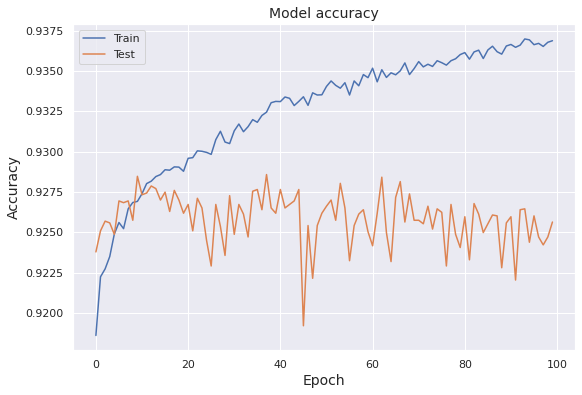

In [ ]:
# Visualization of model accuracy
model_accuracy = pd.DataFrame()
model_accuracy['accuracy'] = history.history['accuracy']
model_accuracy['val_accuracy'] = history.history['val_accuracy']

plt.figure(figsize = (9, 6))
sns.lineplot(data = model_accuracy['accuracy'], label = 'Train')
sns.lineplot(data = model_accuracy['val_accuracy'], label = 'Test')
plt.title('Model accuracy', fontsize = 14)
plt.ylabel('Accuracy', fontsize = 14)
plt.xlabel('Epoch', fontsize = 14)
plt.legend()
plt.show()

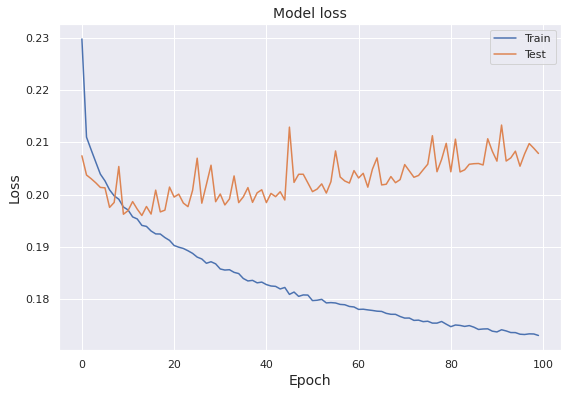

In [ ]:
# Visualization of model loss
model_loss = pd.DataFrame()
model_loss['loss'] = history.history['loss']
model_loss['val_loss'] = history.history['val_loss']

plt.figure(figsize = (9, 6))
sns.lineplot(data = model_loss['loss'], label = 'Train')
sns.lineplot(data = model_loss['val_loss'], label = 'Test')
plt.title('Model loss', fontsize = 14)
plt.ylabel('Loss', fontsize = 14)
plt.xlabel('Epoch', fontsize = 14)
plt.legend()
plt.show()

In [ ]:
# Prediction on test set
pred = model.predict(X_test)
threshold = 0.5
y_pred = [0 if pred[i][0] < threshold else 1 for i in range(len(pred))]

In [ ]:
# Function to compute and visualize confusion matrix
def confusion_mat(y_pred, y_test):
    class_names = [0, 1]
    tick_marks_y = [0.5, 1.5]
    tick_marks_x = [0.5, 1.5]
    confusion_matrix = metrics.confusion_matrix(y_test, y_pred)
    confusion_matrix_df = pd.DataFrame(confusion_matrix, range(2), range(2))
    plt.figure(figsize = (6, 4.75))
    plt.title("Confusion Matrix", fontsize = 14)
    hm = sns.heatmap(confusion_matrix_df, annot = True, annot_kws = {"size": 16}, fmt = 'd') # font size
    hm.set_xlabel("Predicted label", fontsize = 14)
    hm.set_ylabel("True label", fontsize = 14)
    hm.set_xticklabels(class_names, fontdict = {'fontsize': 14}, rotation = 0, ha = "right")
    hm.set_yticklabels(class_names, fontdict = {'fontsize': 14}, rotation = 0, ha = "right")
    plt.grid(False)
    plt.show()

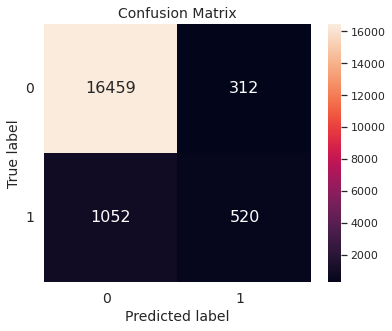

In [ ]:
# Confusion matrix
confusion_mat(y_pred, y_test)

In [ ]:
# Evaluation metrics
acc = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(pd.Series({"Accuracy": acc,
                 "ROC-AUC": roc_auc,
                 "Precision": precision,
                 "Recall": recall,
                 "F1-score": f1}).to_string())

Accuracy     0.925639
ROC-AUC      0.656093
Precision    0.625000
Recall       0.330789
F1-score     0.432612


<a name = "Hyperparameter-Tuning"></a>
# 5. Hyperparameter Tuning

In [ ]:
# Building the model
def model_builder(ht):
    model = Sequential()
    model.add(keras.layers.Flatten(input_shape = (X_train.shape[1],)))

    # Tuning the number of units in the first Dense layer
    ht_units = ht.Int('units', min_value = 32, max_value = 512, step = 32) # 32-512
    model.add(keras.layers.Dense(units = ht_units, activation = 'relu'))
    model.add(keras.layers.Dense(12, activation = 'relu'))
    model.add(keras.layers.Dense(8, activation = 'relu'))
    model.add(keras.layers.Dense(4, activation = 'relu'))
    model.add(keras.layers.Dense(1, activation = 'sigmoid'))

    # Tuning the learning rate for the optimizer
    ht_learning_rate = ht.Choice('learning_rate', values = [0.01, 0.001, 0.0001])

    model.compile(loss = 'binary_crossentropy', optimizer = Adam(learning_rate = ht_learning_rate), metrics = ['accuracy'])

    return model

In [ ]:
# Making the tuner
tuner = kt.Hyperband(model_builder,
                     objective = 'val_accuracy',
                     max_epochs = 10,
                     factor = 3,
                     directory = 'dir_2')

In [ ]:
# Early stopping
stop_early = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 5)

In [ ]:
# Implementing the tuner
tuner.search(X_train, y_train, epochs = 50, validation_split = 0.2, callbacks = [stop_early])

# Get the optimal hyperparameters
best_hparams = tuner.get_best_hyperparameters(num_trials = 1)[0]

print("-------- The hyperparameter search is complete --------")
print(" ")
print(pd.Series({"Optimal number of units in the first densely-connected layer": best_hparams.get('units'),
                 "Optimal learning rate for the optimizer": best_hparams.get('learning_rate')}).to_string())

Trial 30 Complete [00h 00m 55s]
val_accuracy: 0.9146108627319336

Best val_accuracy So Far: 0.9300122857093811
Total elapsed time: 00h 15m 51s
INFO:tensorflow:Oracle triggered exit
-------- The hyperparameter search is complete --------
 
Optimal number of units in the first densely-connected layer    512.00
Optimal learning rate for the optimizer                           0.01


In [ ]:
# Building the model with optimal hyperparameters
model = tuner.hypermodel.build(best_hparams)

# Training the model
history = model.fit(X_train, y_train, epochs = 50, validation_split = 0.2)

# Validation accuracy
val_accuracy_optimal = history.history['val_accuracy']

# Computing best epoch in terms of maximum validation accuracy
best_epoch = val_accuracy_optimal.index(max(val_accuracy_optimal)) + 1
print(" ")
print(pd.Series({"Best epoch": (best_epoch)}).to_string())

Epoch 1/50
1835/1835 [==============================] - 8s 4ms/step - loss: 0.2289 - accuracy: 0.9191 - val_loss: 0.2069 - val_accuracy: 0.9247
Epoch 2/50
1835/1835 [==============================] - 7s 4ms/step - loss: 0.2108 - accuracy: 0.9222 - val_loss: 0.2053 - val_accuracy: 0.9240
Epoch 3/50
1835/1835 [==============================] - 7s 4ms/step - loss: 0.2066 - accuracy: 0.9237 - val_loss: 0.2009 - val_accuracy: 0.9267
Epoch 4/50
1835/1835 [==============================] - 6s 3ms/step - loss: 0.2036 - accuracy: 0.9242 - val_loss: 0.2023 - val_accuracy: 0.9284
Epoch 5/50
1835/1835 [==============================] - 6s 3ms/step - loss: 0.2011 - accuracy: 0.9252 - val_loss: 0.1974 - val_accuracy: 0.9270
Epoch 6/50
1835/1835 [==============================] - 7s 4ms/step - loss: 0.1991 - accuracy: 0.9262 - val_loss: 0.1987 - val_accuracy: 0.9278
Epoch 7/50
1835/1835 [==============================] - 6s 3ms/step - loss: 0.1968 - accuracy: 0.9269 - val_loss: 0.2005 - val_accuracy:

In [ ]:
# Re-instantiating the model
model_tuned = tuner.hypermodel.build(best_hparams)

# Re-training the hypermodel with the optimal number of epochs
model_tuned.fit(X_train, y_train, epochs = best_epoch, validation_split = 0.2)

Epoch 1/14
1835/1835 [==============================] - 8s 4ms/step - loss: 0.2233 - accuracy: 0.9190 - val_loss: 0.2079 - val_accuracy: 0.9247
Epoch 2/14
1835/1835 [==============================] - 7s 4ms/step - loss: 0.2106 - accuracy: 0.9226 - val_loss: 0.2047 - val_accuracy: 0.9214
Epoch 3/14
1835/1835 [==============================] - 7s 4ms/step - loss: 0.2064 - accuracy: 0.9244 - val_loss: 0.2003 - val_accuracy: 0.9239
Epoch 4/14
1835/1835 [==============================] - 8s 4ms/step - loss: 0.2034 - accuracy: 0.9244 - val_loss: 0.1979 - val_accuracy: 0.9266
Epoch 5/14
1835/1835 [==============================] - 7s 4ms/step - loss: 0.2007 - accuracy: 0.9257 - val_loss: 0.1971 - val_accuracy: 0.9289
Epoch 6/14
1835/1835 [==============================] - 6s 3ms/step - loss: 0.1981 - accuracy: 0.9266 - val_loss: 0.2010 - val_accuracy: 0.9273
Epoch 7/14
1835/1835 [==============================] - 6s 3ms/step - loss: 0.1960 - accuracy: 0.9268 - val_loss: 0.1966 - val_accuracy:

In [ ]:
# Evaluation on the test set
eval_tuned = model_tuned.evaluate(X_test, y_test)
print(" ")
print(pd.Series({"Test loss": eval_tuned[0],
                 "Test accuracy": eval_tuned[1]}).to_string())

574/574 [==============================] - 1s 2ms/step - loss: 0.2058 - accuracy: 0.9235
 
Test loss        0.205814
Test accuracy    0.923513


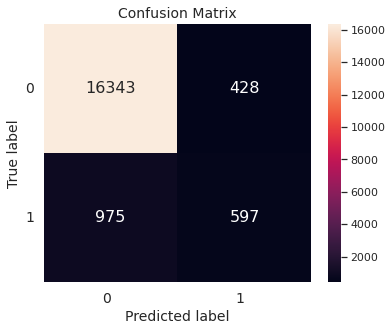

In [ ]:
# Confusion matrix
pred_tuned = model_tuned.predict(X_test)
threshold = 0.5
y_pred_tuned = [0 if pred_tuned[i][0] < threshold else 1 for i in range(len(pred_tuned))]
confusion_mat(y_pred_tuned, y_test)

In [ ]:
# Evaluation metrics
acc = accuracy_score(y_test, y_pred_tuned)
roc_auc = roc_auc_score(y_test, y_pred_tuned)
precision = precision_score(y_test, y_pred_tuned)
recall = recall_score(y_test, y_pred_tuned)
f1 = f1_score(y_test, y_pred_tuned)

print(pd.Series({"Accuracy": acc,
                 "ROC-AUC": roc_auc,
                 "Precision": precision,
                 "Recall": recall,
                 "F1-score": f1}).to_string())

Accuracy     0.923513
ROC-AUC      0.677125
Precision    0.582439
Recall       0.379771
F1-score     0.459761


### Saving and loading the model

In [ ]:
# Saving the model
model_tuned.save('model_tuned.h5')

In [ ]:
# Loading the model
model_tuned_loaded = load_model('model_tuned.h5')

<a name = "Explainable-AI"></a>
# 6. Explainable AI

In [ ]:
# Loading JavaScript library
shap.initjs()

# Sampling from test data predictors
X_test_sample = X_test.sample(50)

# Predicted values corresponding to the sample
pred_tuned_sample = np.array(pd.Series(data = pred_tuned.flatten(), index = X_test.index)[X_test_sample.index])
y_pred_tuned_sample = np.array(pd.Series(data = y_pred_tuned, index = X_test.index)[X_test_sample.index])

# Wrapper function
def wrap(X):
    return model_tuned.predict(X).flatten()

# Explainer
explainer = shap.KernelExplainer(wrap, X_test_sample)

# Computing SHAP values based on the sample
shap_values = explainer.shap_values(X_test_sample, nsamples = 500)

  0%|          | 0/50 [00:00<?, ?it/s]

## Global interpretation

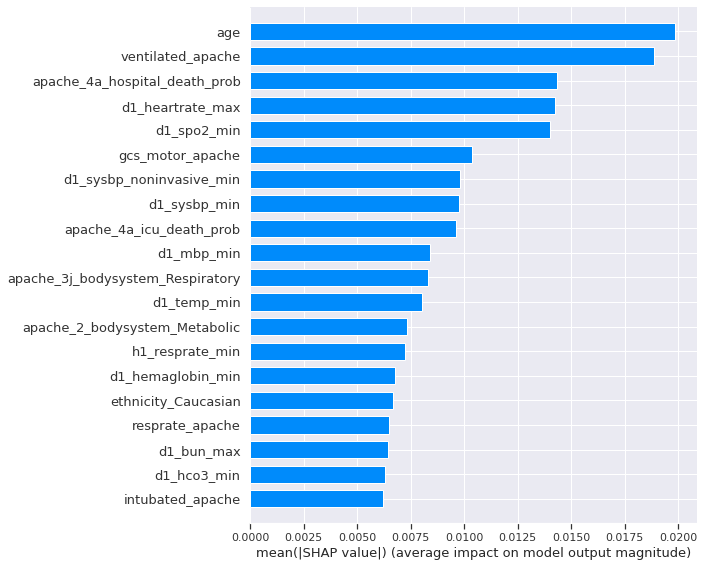

In [ ]:
# Summary plot
shap.summary_plot(shap_values = shap_values, features = X_test_sample, plot_type = 'bar')

## Local interpretation

### Explaining single prediction

In [ ]:
# Force plot
shap.initjs()
row = math.floor(3*len(X_test_sample)/4)
print(pd.Series({"Predicted value": pred_tuned_sample[row]}).to_string())
shap_values_row = explainer.shap_values(X_test_sample.iloc[row, :], nsamples = 500)
shap.force_plot(base_value = explainer.expected_value,
                shap_values = shap_values_row,
                features = X_test_sample.iloc[row, :],
                feature_names = X_test_sample.columns)

Predicted value    0.004913


Predicted value    0.004913


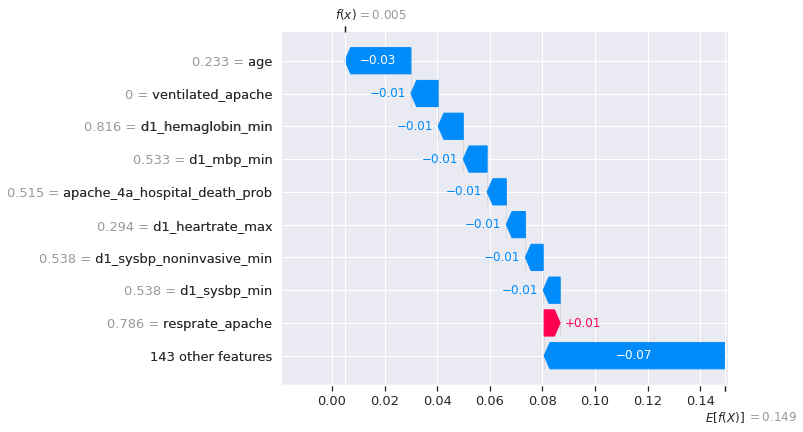

In [ ]:
# Waterfall plot
print(pd.Series({"Predicted value": pred_tuned_sample[row]}).to_string())
shap.waterfall_plot(shap.Explanation(values = shap_values_row,
                                     base_values = explainer.expected_value,
                                     data = X_test_sample.iloc[row, :],
                                     feature_names = X_test_sample.columns.tolist()))

Predicted value    0.004913


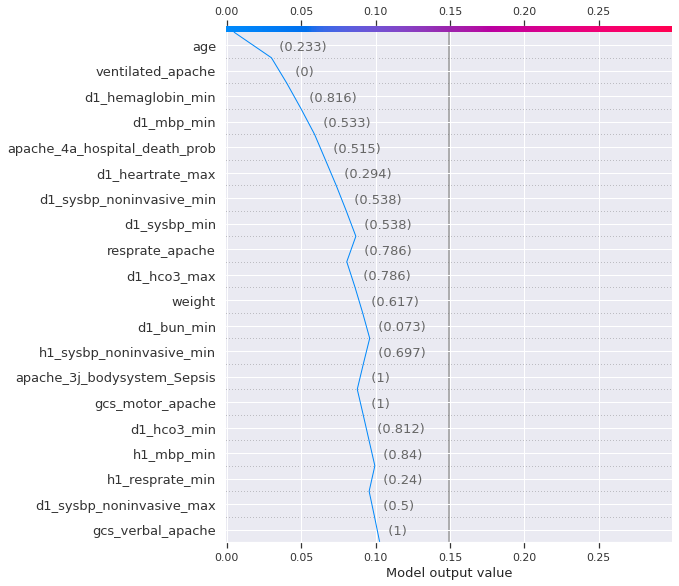

In [ ]:
# Decision plot
print(pd.Series({"Predicted value": pred_tuned_sample[row]}).to_string())
shap.decision_plot(base_value = explainer.expected_value,
                   shap_values = shap_values_row,
                   features = X_test_sample.iloc[row, :],
                   feature_names = X_test_sample.columns.tolist())

### Explaining multiple predictions

In [ ]:
# Force plot
shap.initjs()
shap.force_plot(base_value = explainer.expected_value,
                shap_values = shap_values,
                features = X_test_sample,
                feature_names = X_test_sample.columns)

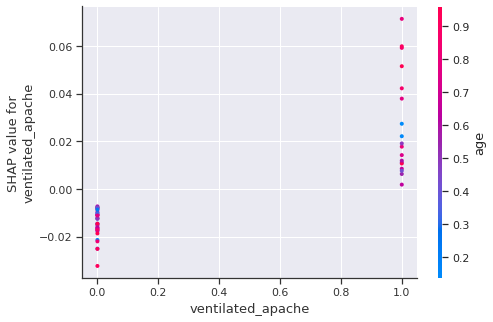

In [ ]:
# Dependence plot for ventilated_apache
shap.dependence_plot(ind = 'ventilated_apache', shap_values = shap_values, features = X_test_sample)

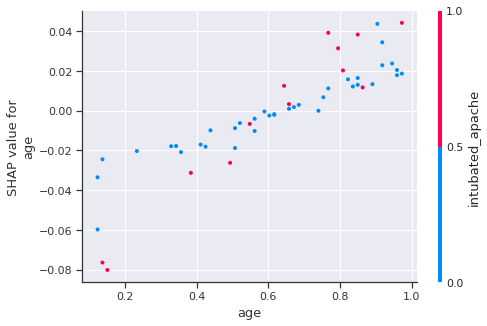

In [ ]:
# Dependence plot for age
shap.dependence_plot(ind = 'age', shap_values = shap_values, features = X_test_sample)

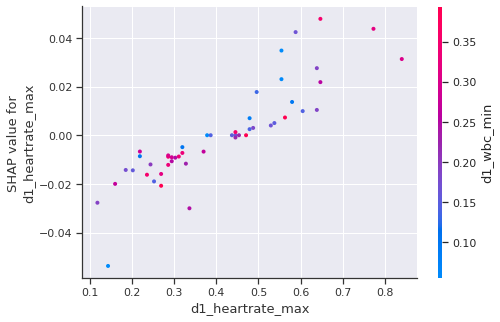

In [ ]:
# Dependence plot for age
shap.dependence_plot(ind = 'd1_heartrate_max', shap_values = shap_values, features = X_test_sample)

Predicted values
 
[0.03051385 0.9077343  0.5093913  0.01491031 0.00207022 0.17539304]
 


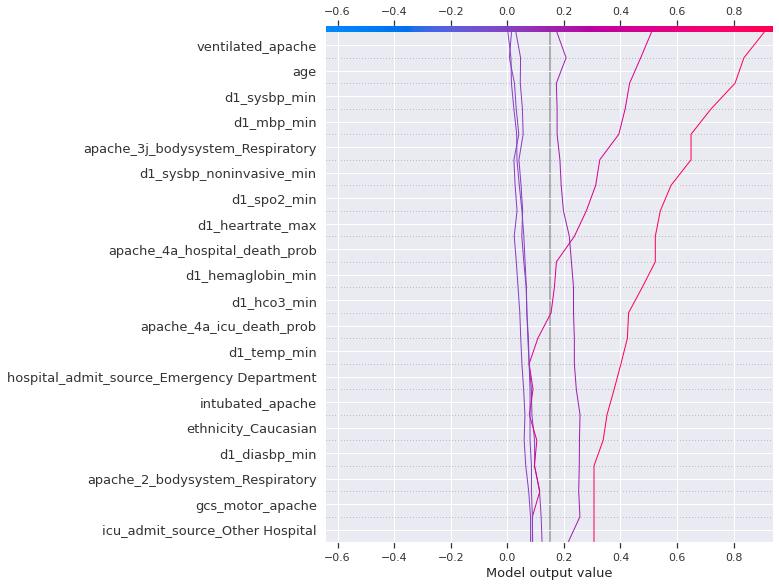

In [ ]:
# Decision plot
print("Predicted values")
print(" ")
rows = [i*math.floor(len(X_test_sample)/6) for i in range(6)]
print(np.array(pd.Series(pred_tuned_sample)[rows]))
print(" ")
shap.decision_plot(base_value = explainer.expected_value,
                   shap_values = shap_values[rows],
                   features = X_test_sample.iloc[rows, :],
                   feature_names = X_test_sample.columns.tolist())

<a name = "Acknowledgements"></a>
# Acknowledgements

- [Global Open Source Severity of Illness Score (GOSSIS) dataset](https://journals.lww.com/ccmjournal/Citation/2019/01001/33__THE_GLOBAL_OPEN_SOURCE_SEVERITY_OF_ILLNESS.36.aspx)
- [Introduction to the Keras Tuner](https://www.tensorflow.org/tutorials/keras/keras_tuner)

<a name = "References"></a>
# References

- [Freedman-Diaconis rule](https://en.wikipedia.org/wiki/Freedman%E2%80%93Diaconis_rule)
- [One-hot](https://en.wikipedia.org/wiki/One-hot)

In [ ]:
# Runtime and memory usage
stop = time.time()
process = psutil.Process(os.getpid())

In [ ]:
print(pd.Series({"Process runtime": "{:.2f} seconds".format(float(stop - start)),
                 "Process memory usage": "{:.2f} MB".format(float(process.memory_info()[0]/(1024*1024)))}).to_string())

Process runtime         2533.99 seconds
Process memory usage         2830.22 MB
